# Object Detection using YOLOv8

The goal is to detect guitars in images using the YOLOv8 model. YOLOv8 can be used for object detection, image classification, and instance segmentation tasks.

## 1. Importing Libraries


In [1]:
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os
from google.colab.patches import cv2_imshow

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.7/780.7 kB 9.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In the YOLO format, a bounding box is defined by four values:
- x_centre: The x-coordinate of the center of the bounding box.

- y_ center​: The y-coordinate of the center of the bounding box.

- width: The width of the bounding box.

- height: The height of the bounding box.

The xyxy format, also known as the corner format, defines a bounding box using:

- xmin​: The x-coordinate of the top-left corner.

- ymin: The y-coordinate of the top-left corner.

- xmax​: The x-coordinate of the bottom-right corner.

- ymax​: The y-coordinate of the bottom-right corner.

In [4]:
def convert_yolo2xyxy(bboxes):
    x_center, y_center, width, height = bboxes
    xmin = x_center - width / 2
    ymin = y_center - height / 2
    xmax = x_center + width / 2
    ymax = y_center + height / 2
    return xmin, ymin, xmax, ymax

In [5]:
def plot_bbox(image, bboxes, labels):

    if len(image.shape) == 2:
        h, w = image.shape
    else:
        h, w, _ = image.shape

    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = convert_yolo2xyxy(box)

        # Denormalize
        xmin = int(x1 * w)
        ymin = int(y1 * h)
        xmax = int(x2 * w)
        ymax = int(y2 * h)

        # thickness of bbox:
        thickness = max(2, int(w / 275))

        # using cv2 for drawing a rectangle
        cv2.rectangle(
            image,
            (xmin, ymin),
            (xmax, ymax),
            (0, 0, 255),
            thickness,
        )

    return image

In [6]:
def plot(image_paths, label_paths, num_samples):
    all_images = []

    all_images.extend(glob.glob(image_paths + '/*.jpg'))
    all_images.extend(glob.glob(image_paths + '/*.JPG'))
    all_images.extend(glob.glob(image_paths + '/*.png'))
    all_images.extend(glob.glob(image_paths + '/*.PNG'))

    all_images.sort()
    num_img = len(all_images)

    plt.figure(figsize=(15, 12))

    for i in range(num_samples):
        j = random.randint(0, num_img - 1) # Randomly select an image index and retrieve the corresponding image path.
        image_name = all_images[j]
        image_basename = os.path.basename(image_name).split('.')[0] # Extract the base name of the image file (without extension)
        image = cv2.imread(all_images[j])

        # open the label file associated with the selected image (based on the image name)
        with open(os.path.join(label_paths, image_basename + '.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                parts = label_line.split()
                label = parts[0]
                x_c, y_c, w, h = map(float, parts[1:])
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)

        result_image = plot_bbox(image, bboxes, labels)

        plt.subplot(2, 2, i + 1)
        plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')

    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()


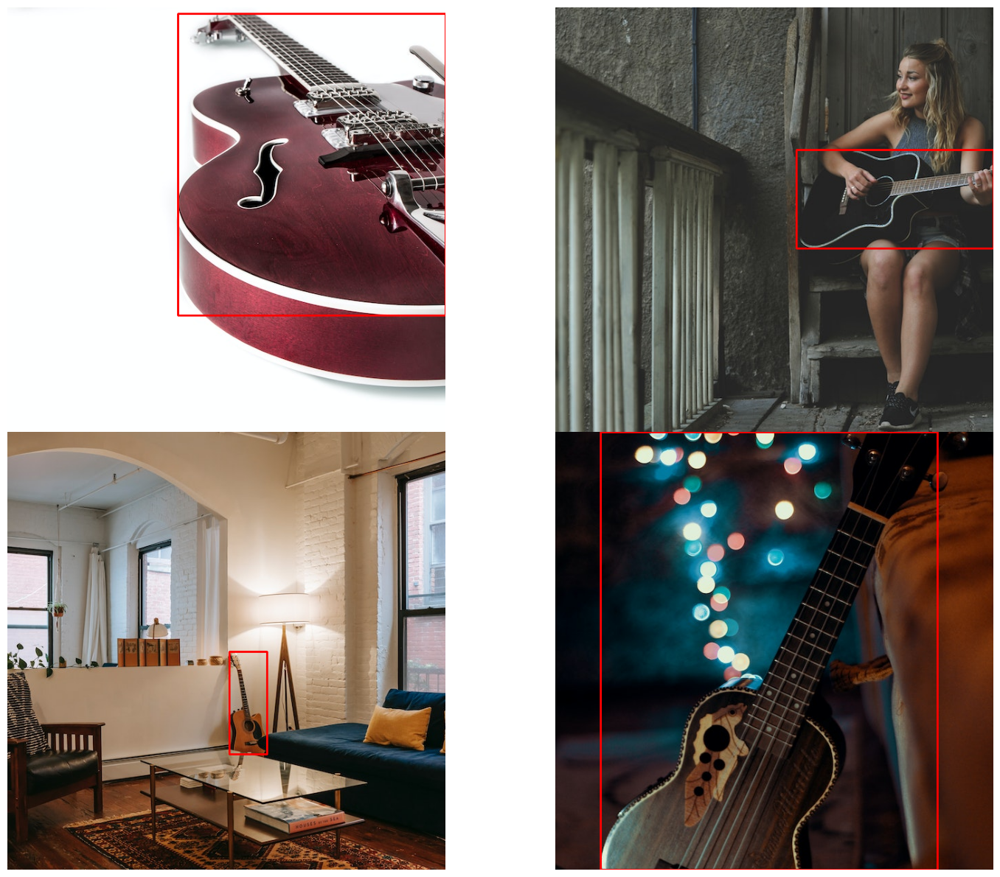

In [7]:
plot(
    image_paths='/content/drive/MyDrive/Datasets/Guitar_dataset/train/images',
    label_paths='/content/drive/MyDrive/Datasets/Guitar_dataset/train/labels',
    num_samples=4,
)

In [ ]:
# Creating a YAML configuration file
%%writefile Guitar_v8.yaml
path: '/content/drive/MyDrive/Datasets/Guitar_dataset'
train: '/content/drive/MyDrive/Datasets/Guitar_dataset/train/images'
val: '/content/drive/MyDrive/Datasets/Guitar_dataset/val/images'

# class names
names:
  0: 'Guitar'

Writing Guitar_v8.yaml


In [ ]:
# Training the model

!yolo task=detect mode=train model=yolov8n.pt data=/content/Guitar_v8.yaml epochs=200 batch=16 imgsz=640 augment=True  name=yolov8n_v8_50e

100% 6.23M/6.23M [00:00<00:00, 159MB/s]
Ultralytics YOLOv8.2.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Guitar_v8.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v8_50e, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=

In [ ]:
# Evaluate the trained model on the validation set using the trained model's weights file.

!yolo task=detect mode=val model=/content/runs/detect/yolov8n_v8_50e/weights/best.pt name=yolov8n_eval data=/content/Guitar_v8.yaml

Ultralytics YOLOv8.2.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/Datasets/Guitar_dataset/val/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:01<00:00,  1.16it/s]
                   all         20         23      0.951          1      0.993      0.863
Speed: 0.3ms preprocess, 21.5ms inference, 0.0ms loss, 42.7ms postprocess per image
Results saved to runs/detect/yolov8n_eval
💡 Learn more at https://docs.ultralytics.com/modes/val


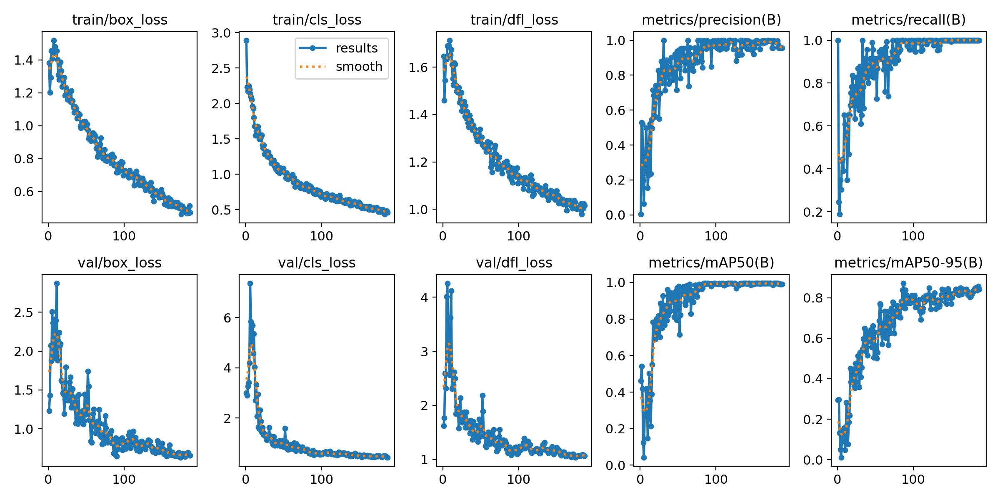

In [ ]:
cv2_imshow(cv2.imread("/content/runs/detect/yolov8n_v8_50e/results.png"))

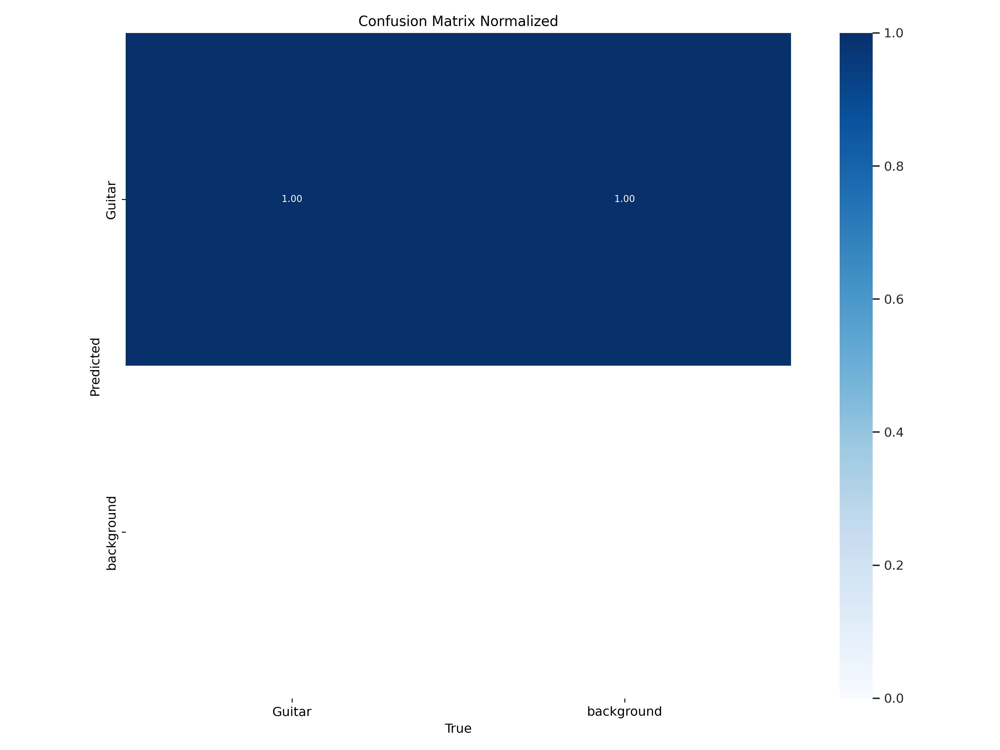

In [ ]:
cv2_imshow(cv2.imread("/content/runs/detect/yolov8n_v8_50e/confusion_matrix_normalized.png"))

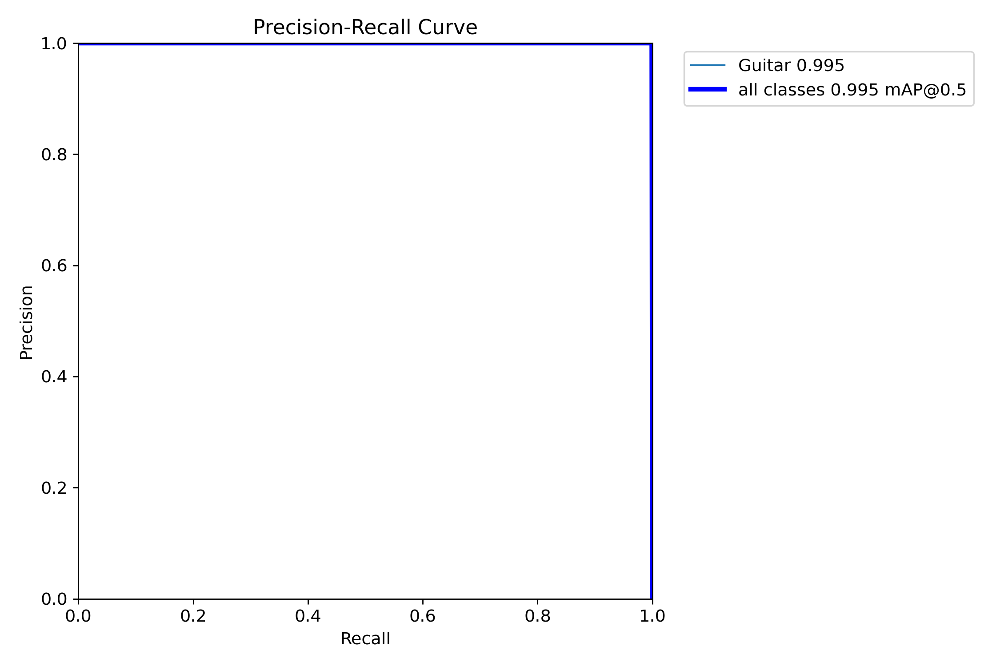

In [ ]:
cv2_imshow(cv2.imread("/content/runs/detect/yolov8n_v8_50e/PR_curve.png"))

In [ ]:
# Make predictions.

!yolo task=detect mode=predict model=/content/runs/detect/yolov8n_v8_50e/weights/best.pt source=/content/drive/MyDrive/Datasets/Guitar_dataset/val/images imgsz=640 conf=0.6 name=yolov8n_v8_50e_infer640

Ultralytics YOLOv8.2.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/20 /content/drive/MyDrive/Datasets/Guitar_dataset/val/images/val_img (1).jpg: 640x640 1 Guitar, 11.3ms
image 2/20 /content/drive/MyDrive/Datasets/Guitar_dataset/val/images/val_img (10).jpg: 640x640 4 Guitars, 7.4ms
image 3/20 /content/drive/MyDrive/Datasets/Guitar_dataset/val/images/val_img (11).jpg: 640x640 1 Guitar, 7.3ms
image 4/20 /content/drive/MyDrive/Datasets/Guitar_dataset/val/images/val_img (12).jpg: 640x640 1 Guitar, 7.3ms
image 5/20 /content/drive/MyDrive/Datasets/Guitar_dataset/val/images/val_img (13).jpg: 640x640 1 Guitar, 7.3ms
image 6/20 /content/drive/MyDrive/Datasets/Guitar_dataset/val/images/val_img (14).jpg: 640x640 1 Guitar, 7.3ms
image 7/20 /content/drive/MyDrive/Datasets/Guitar_dataset/val/images/val_img (15).jpg: 640x640 1 Guitar, 7.3ms
image 8/20 /content/drive/MyDrive/Datasets/Guitar_datas

In [ ]:
def visualize(result_dir, num_samples=20):
    """
    Function accepts a list of images and plots them in a 2x2 grid.
    """
    plt.figure(figsize=(100, 100))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    random.shuffle(image_names)
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(20, 1, i+1)
        plt.imshow(image)
        plt.axis('off')
        if i == num_samples-1:
            break
    plt.tight_layout()
    plt.show()

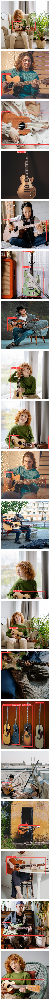

In [ ]:
visualize('/content/runs/detect/yolov8n_v8_50e_infer640')